In [20]:
# basic imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
import random

# image manipulation
from PIL import Image
from pillow_heif import register_heif_opener

# sklearn
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split

#tensorflow
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical


In [25]:
main_dir = os.path.join(os.path.expanduser("~"), "Downloads", "pill_vids_output")
max_images_per_folder = 1900

# Get the list of subfolders (classes)
class_folders = [f.path for f in os.scandir(main_dir) if f.is_dir()]

# Initialize empty lists for storing image arrays and class labels
images = []
labels = []
target_size = (224, 224)

# Iterate through each class folder
for class_folder in class_folders:
    
    # Get the class label from the folder name
    class_label = os.path.basename(class_folder)

    # Get the list of image files in the class folder
    image_files = os.listdir(class_folder)

    # Randomly sample images if there are more than the maximum allowed
    if len(image_files) > max_images_per_folder:
        image_files = random.sample(image_files, max_images_per_folder)

    # Iterate through each image file in the sampled list
    for image_file in image_files:
        # Construct the path to the image file
        image_path = os.path.join(class_folder, image_file)
        
        # Read and convert the image using PIL
        image = Image.open(image_path)
        rgb_image = image.convert('RGB')

        # Convert the image to NumPy array and append to the list
        images.append(np.array(image))

        # Append the corresponding class label to the list
        labels.append(class_label)
    
    print(f"✅ {class_folder}: Processed {len(image_files)} images")

print(f"✅ All images preprocessed.")

# Convert the lists to NumPy arrays
images = np.array(images)
labels = np.array(labels)

# Save the image and label arrays to files
np.save(os.path.join(os.path.expanduser('~'), "Downloads", "images_20230606.npy"), images)
print(f"✅ images.npy saved to Downloads")
np.save(os.path.join(os.path.expanduser('~'), "Downloads", "labels_20230606.npy"), labels)
print(f"✅ labels.npy saved to Downloads")

# Print the shape of the image array and label array
print("Image array shape:", images.shape)
print("Label array shape:", labels.shape)


✅ /Users/ninaadkalla/Downloads/pill_vids_output/49702020218: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/advil_400: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/93213001: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/591554405: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/7365022: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/kirkland_acetaminophen: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/57664010488: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/93293201: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/173024255: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/555032402: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/74611413: Processed 1900 images
✅ /Users/ninaadkalla/Downloads/pill_vids_output/93725401: Processed 1900 images
✅ /Users/ninaadka

In [26]:
# Loads the images and labels from the saved NumPy arrays in Downloads
images = np.load(os.path.join(os.path.expanduser('~'), "Downloads", "images_20230606.npy"))
labels = np.load(os.path.join(os.path.expanduser('~'), "Downloads", "labels_20230606.npy"))

In [27]:
#Inception v3 preprocessing
'''def preprocess_input(x):
    x /= 255.
    x -= 0.5
    x *= 2.
    return x'''
    
pp_images = images / 255.0 
pp_images -= 0.5 #inception v3 specific
pp_images *= 2.0 #inception v3 specific

In [28]:
# how many images are there for each pill?
ndc11, counts = np.unique(labels, return_counts=True)
arr = np.asarray((counts, ndc11)).T
sorted_arr = arr[arr[:, 0].argsort()[::-1]]
sorted_arr

array([['1900', 'life_acetaminophen'],
       ['1900', '591554405'],
       ['1900', '173024255'],
       ['1900', '29316013'],
       ['1900', '39022310'],
       ['1900', '49702020218'],
       ['1900', '50111039801'],
       ['1900', '50111046801'],
       ['1900', '50419010510'],
       ['1900', '555032402'],
       ['1900', '555099702'],
       ['1900', '57664010488'],
       ['1900', '63459070160'],
       ['1900', 'kirkland_acetaminophen'],
       ['1900', '7365022'],
       ['1900', '74611413'],
       ['1900', '93071101'],
       ['1900', '93213001'],
       ['1900', '93226801'],
       ['1900', '93293201'],
       ['1900', '93725401'],
       ['1900', 'advil'],
       ['1900', 'advil_400'],
       ['1900', 'advil_liqui-gel'],
       ['1900', '172496058']], dtype='<U22')

In [29]:
encoder = OrdinalEncoder() # Instanciate One hot encoder
encoder.fit(labels.reshape(-1, 1)) # Fit the encoder to the labels
encoder.categories_

[array(['172496058', '173024255', '29316013', '39022310', '49702020218',
        '50111039801', '50111046801', '50419010510', '555032402',
        '555099702', '57664010488', '591554405', '63459070160', '7365022',
        '74611413', '93071101', '93213001', '93226801', '93293201',
        '93725401', 'advil', 'advil_400', 'advil_liqui-gel',
        'kirkland_acetaminophen', 'life_acetaminophen'], dtype='<U22')]

In [30]:
encoded_labels = encoder.fit_transform(labels.reshape(-1, 1)) # Transform the labels using the encoder
encoded_labels = encoded_labels.reshape(-1) # Reshape the encoded labels to a 1D array
encoded_labels.shape

(47500,)

In [31]:
np.unique(labels), np.unique(encoded_labels)

(array(['172496058', '173024255', '29316013', '39022310', '49702020218',
        '50111039801', '50111046801', '50419010510', '555032402',
        '555099702', '57664010488', '591554405', '63459070160', '7365022',
        '74611413', '93071101', '93213001', '93226801', '93293201',
        '93725401', 'advil', 'advil_400', 'advil_liqui-gel',
        'kirkland_acetaminophen', 'life_acetaminophen'], dtype='<U22'),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24.]))

In [32]:
X_train, X_test, y_train, y_test = train_test_split(pp_images, encoded_labels, test_size=0.3)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3) 

print(f'X_train shape: {X_train.shape}, y_train shape: {y_train.shape}\nX_val shape: {X_val.shape}, y_val shape: {y_val.shape}\nX_test shape: {X_test.shape}, y_test shape: {y_test.shape}')

X_train shape: (23275, 160, 160, 3), y_train shape: (23275,)
X_val shape: (9975, 160, 160, 3), y_val shape: (9975,)
X_test shape: (14250, 160, 160, 3), y_test shape: (14250,)


In [33]:
y_train = to_categorical(y_train)
y_val = to_categorical(y_val)
y_test = to_categorical(y_test)

**MODEL TRAINING**

In [11]:
baseline_model = 0.2

In [38]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.preprocessing.image import ImageDataGenerator #useful for data augmentation
from tensorflow.keras.callbacks import ReduceLROnPlateau #useful for adjusting the learning rate during training
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model
from tensorflow.keras.layers import Input

# Load the pre-trained Inception-v3 model without the top (fully connected) layers
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(160, 160, 3))

# Freeze the pre-trained layers so they are not updated during training
base_model.trainable = False

# Add your own classification layers on top of the base model
inp = Input((160, 160, 3))
x = base_model(inp)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(32, activation='relu')(x)
x = layers.Dropout(0.25)(x)  
x = tf.keras.layers.Dense(16, activation='relu')(x)
x = layers.Dropout(0.25)(x)  
#x = tf.keras.layers.Dense(32, activation='relu')(x)
#x = layers.Dropout(0.10)(x)  
predictions = tf.keras.layers.Dense(25, activation='softmax')(x) 

# Create the final model
model = tf.keras.Model(inputs=inp, outputs=predictions)

# Compile the model
learning_rate = 0.001
optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callback to stop training after a certain patience threshold
es = EarlyStopping(patience=3, restore_best_weights=True)

# Callback to reduce learning rate
#reduce_lr = ReduceLROnPlateau(factor=0.002, patience=5)

# Create data generators from variables
batch_size = 16
num_epochs = 250

train_datagen = ImageDataGenerator(
    rotation_range=20,  # randomly rotate images in the range (degrees)
    width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
    shear_range=0.2,  # apply shear transformation
    zoom_range=0.2,  # randomly zoom in and out
    horizontal_flip=True  # randomly flip images horizontally
    )

train_generator = train_datagen.flow(X_train, y_train, batch_size=batch_size)

validation_datagen = ImageDataGenerator(
    rotation_range=20,  # randomly rotate images in the range (degrees)
    width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
    shear_range=0.2,  # apply shear transformation
    zoom_range=0.2,  # randomly zoom in and out
    horizontal_flip=True  # randomly flip images horizontally
    )

validation_generator = validation_datagen.flow(X_val, y_val, batch_size=batch_size)

# Train the model using the generators
history = model.fit(
    train_generator,
    steps_per_epoch=X_train.shape[0] // batch_size,
    epochs=num_epochs,
    validation_data=validation_generator,
    validation_steps=X_val.shape[0] // batch_size,
    callbacks=[es],
    verbose=1
)


Epoch 1/250


2023-06-06 14:52:34.112588: I tensorflow/core/common_runtime/executor.cc:1210] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


1454/1454 [==============================] - ETA: 0s - loss: 2.0380 - accuracy: 0.3341

2023-06-06 14:55:18.098214: I tensorflow/core/common_runtime/executor.cc:1210] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


1454/1454 [==============================] - 232s 158ms/step - loss: 2.0380 - accuracy: 0.3341 - val_loss: 0.8297 - val_accuracy: 0.8108
Epoch 2/250
1454/1454 [==============================] - 227s 156ms/step - loss: 1.3923 - accuracy: 0.5170 - val_loss: 0.5592 - val_accuracy: 0.9040
Epoch 3/250
1454/1454 [==============================] - 228s 157ms/step - loss: 1.2215 - accuracy: 0.5741 - val_loss: 0.4466 - val_accuracy: 0.9225
Epoch 4/250
1454/1454 [==============================] - 232s 159ms/step - loss: 1.1529 - accuracy: 0.5954 - val_loss: 0.4056 - val_accuracy: 0.9452
Epoch 5/250
1454/1454 [==============================] - 229s 157ms/step - loss: 1.1291 - accuracy: 0.6130 - val_loss: 0.3703 - val_accuracy: 0.9460
Epoch 6/250
1454/1454 [==============================] - 228s 157ms/step - loss: 1.0858 - accuracy: 0.6211 - val_loss: 0.4038 - val_accuracy: 0.9371
Epoch 7/250
1454/1454 [==============================] - 228s 157ms/step - loss: 1.0565 - accuracy: 0.6355 - val_loss:

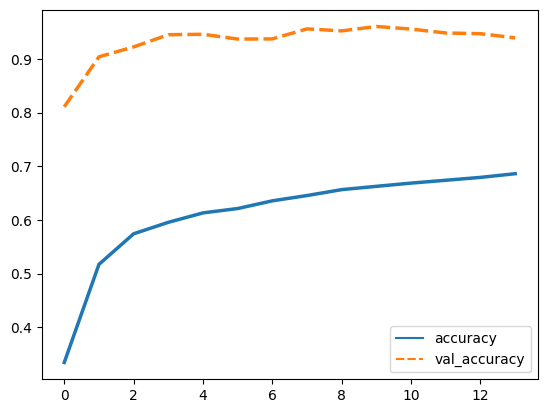

In [39]:
# compare accuracy accuracy on training and validation data
df_history = pd.DataFrame(history.history)
sns.lineplot(data=df_history[['accuracy','val_accuracy']], palette="tab10", linewidth=2.5);

In [40]:
model.save('pillpic_model_20230606.h5')

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


**PREDICTION**

In [41]:
from roboflow import Roboflow
rf = Roboflow(api_key="PA7iGNwB8gUmOWCyfNt3")
project = rf.workspace().project("pill-pick")
rf_model = project.version(2).model

loading Roboflow workspace...
loading Roboflow project...


In [42]:
images_test_dir = os.path.join(os.path.expanduser('~'), 'Downloads', 'images_test')
images_test_dir

'/Users/ninaadkalla/Downloads/images_test'

In [43]:
np.unique(labels), np.unique(encoded_labels)

(array(['172496058', '173024255', '29316013', '39022310', '49702020218',
        '50111039801', '50111046801', '50419010510', '555032402',
        '555099702', '57664010488', '591554405', '63459070160', '7365022',
        '74611413', '93071101', '93213001', '93226801', '93293201',
        '93725401', 'advil', 'advil_400', 'advil_liqui-gel',
        'kirkland_acetaminophen', 'life_acetaminophen'], dtype='<U22'),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24.]))

In [44]:
'''pillname_dict = {0:'advil',
                 1:'advil_400',
                 2:'advil_liqui-gel',
                 3:'kirkland_acetaminophen',
                 4:'life_acetaminophen',
                }'''

pillname_dict = {0:'172496058', 1:'173024255', 2:'29316013', 3:'39022310', 4:'49702020218',
                 5:'50111039801', 6:'50111046801', 7:'50419010510', 8:'555032402', 9:'555099702', 
                 10:'57664010488', 11:'591554405', 12:'63459070160', 13:'7365022', 14:'74611413',
                 15:'93071101', 16:'93213001', 17:'93226801', 18:'93293201', 19:'93725401',
                 20:'advil', 21:'advil_400', 22:'advil_liqui-gel', 23:'kirkland_acetaminophen', 24:'life_acetaminophen'}

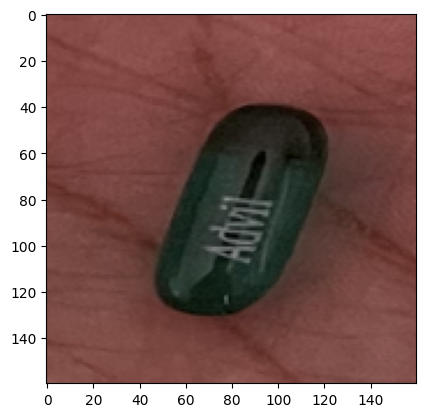

The image you uploaded is: IMG_6310.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 99.77%



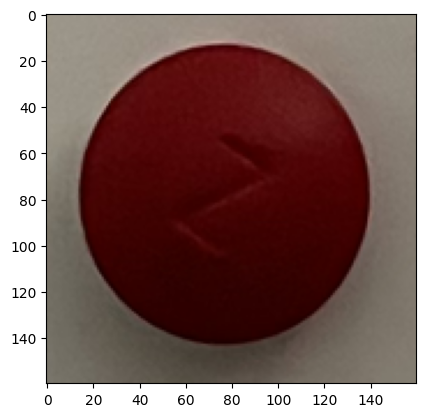

The image you uploaded is: IMG_6306.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 81.08%



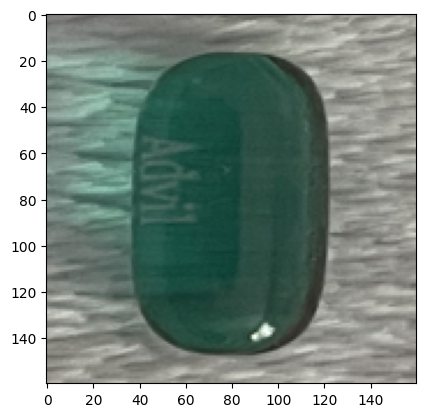

The image you uploaded is: IMG_6280.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 100.0%



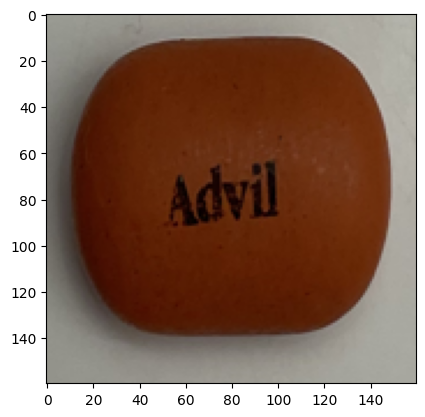

The image you uploaded is: IMG_6279.HEIC
✅ The pill that you uploaded is: 20 advil, with probability 91.32%



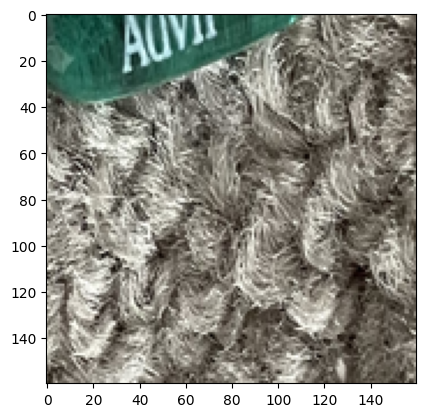

The image you uploaded is: IMG_6296.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 93.33%



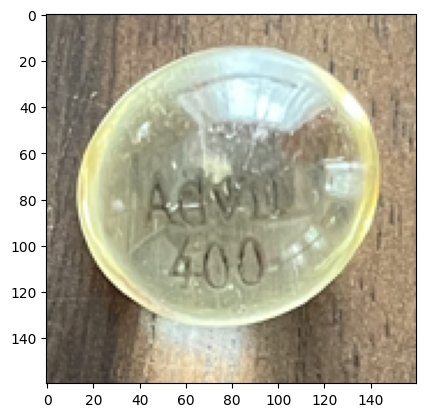

The image you uploaded is: IMG_6263.HEIC
✅ The pill that you uploaded is: 21 advil_400, with probability 72.78%



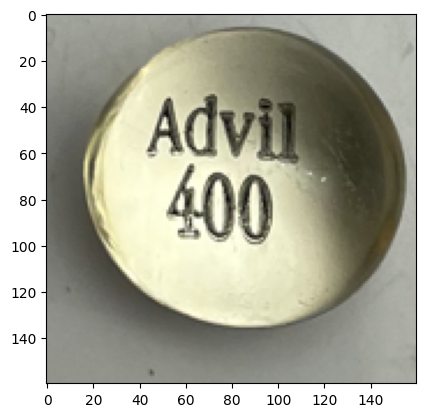

The image you uploaded is: IMG_6275.HEIC
✅ The pill that you uploaded is: 21 advil_400, with probability 77.92%



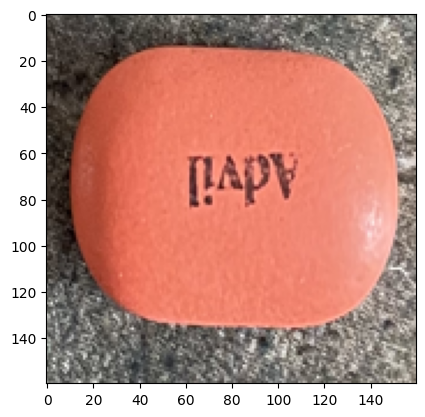

The image you uploaded is: IMG_6274.HEIC
✅ The pill that you uploaded is: 20 advil, with probability 71.35%



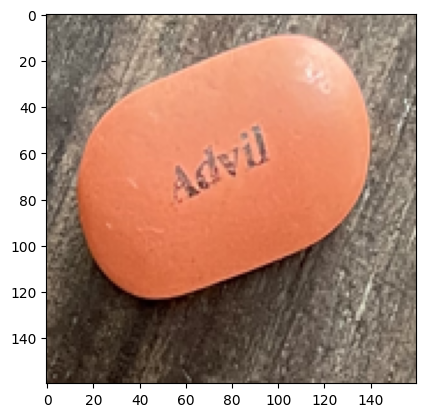

The image you uploaded is: IMG_6262.HEIC
✅ The pill that you uploaded is: 20 advil, with probability 54.08%



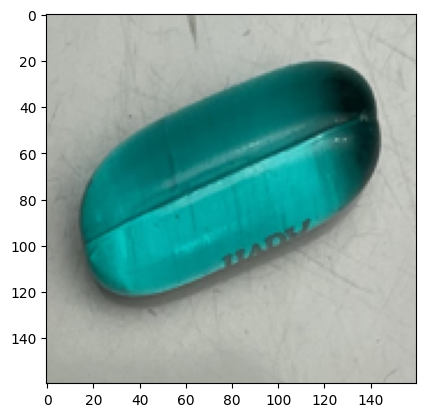

The image you uploaded is: IMG_6278.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 99.68%



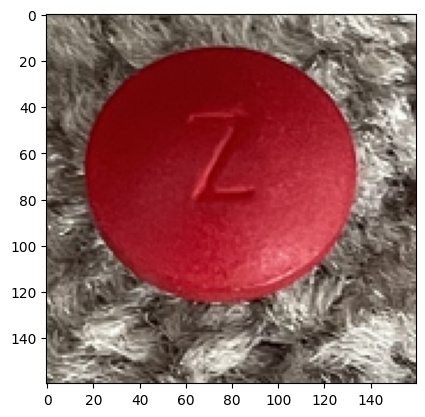

The image you uploaded is: IMG_6297.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 92.18%



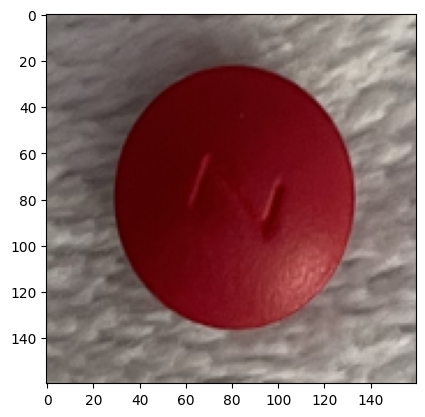

The image you uploaded is: IMG_6281.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 80.12%



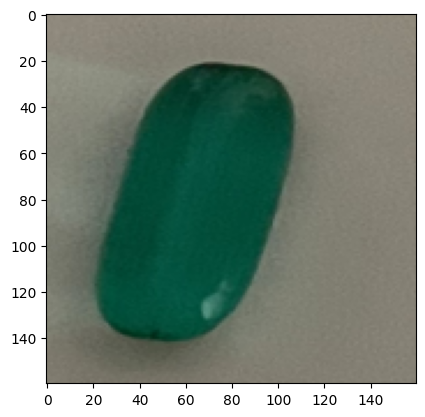

The image you uploaded is: IMG_6307.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 62.77%



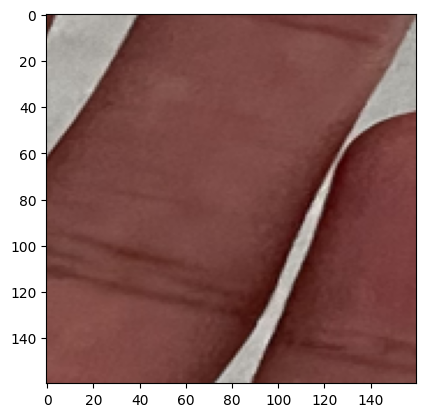

The image you uploaded is: IMG_6311.HEIC
✅ The pill that you uploaded is: 3 39022310, with probability 93.56%



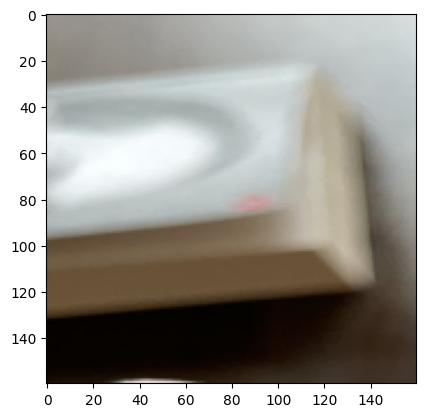

The image you uploaded is: IMG_6265.HEIC
✅ The pill that you uploaded is: 21 advil_400, with probability 27.85%



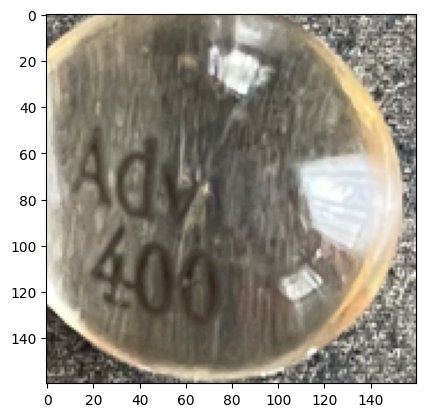

The image you uploaded is: IMG_6273.HEIC
✅ The pill that you uploaded is: 21 advil_400, with probability 79.84%



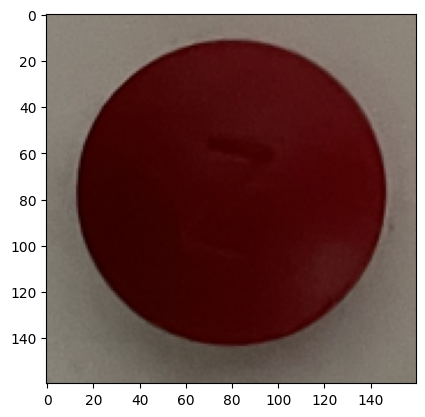

The image you uploaded is: IMG_6300.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 39.08%



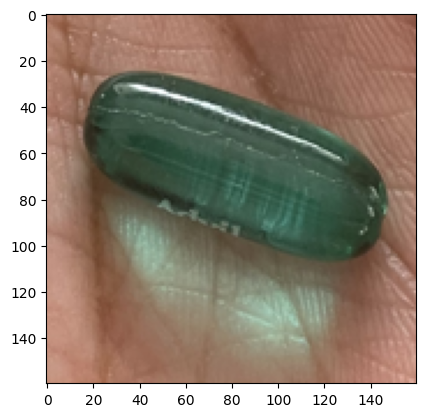

The image you uploaded is: IMG_6269.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 98.67%



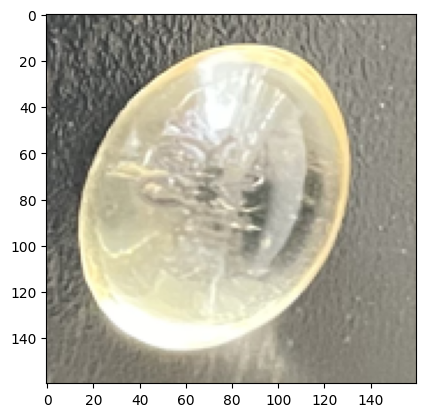

The image you uploaded is: IMG_6286.HEIC
✅ The pill that you uploaded is: 21 advil_400, with probability 93.41%



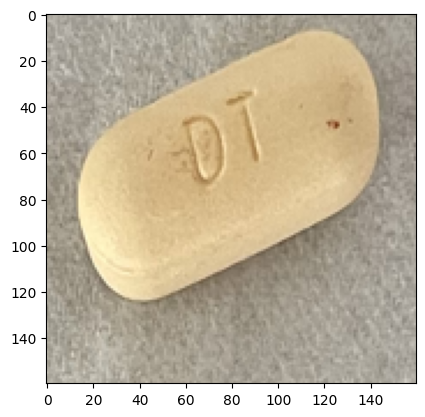

The image you uploaded is: IMG_6290.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 74.8%



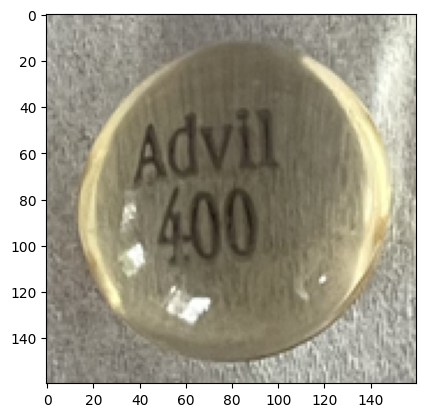

The image you uploaded is: IMG_6291.HEIC
✅ The pill that you uploaded is: 21 advil_400, with probability 63.19%



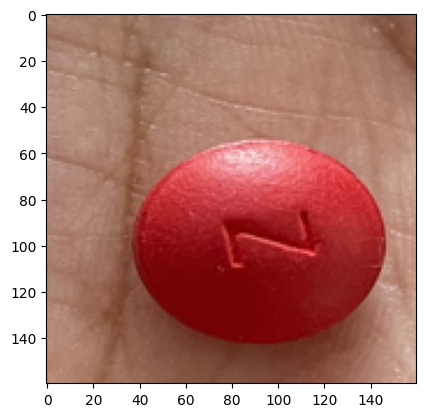

The image you uploaded is: IMG_6268.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 44.32%



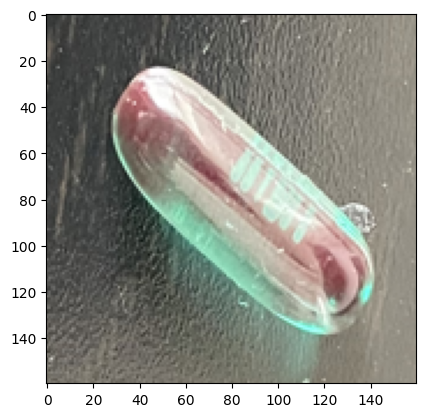

The image you uploaded is: IMG_6287.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 99.95%



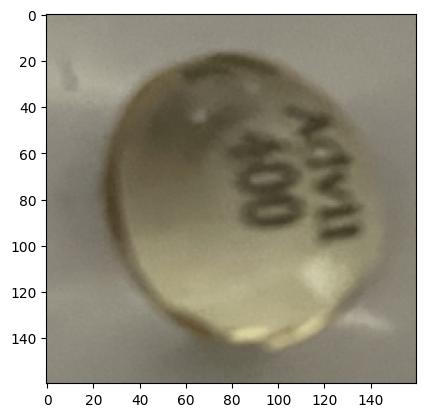

The image you uploaded is: IMG_6301.HEIC
✅ The pill that you uploaded is: 21 advil_400, with probability 77.51%



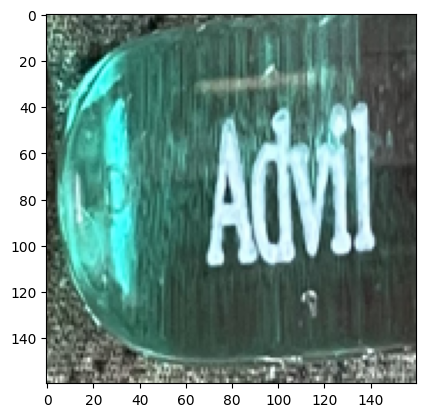

The image you uploaded is: IMG_6272.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 99.72%



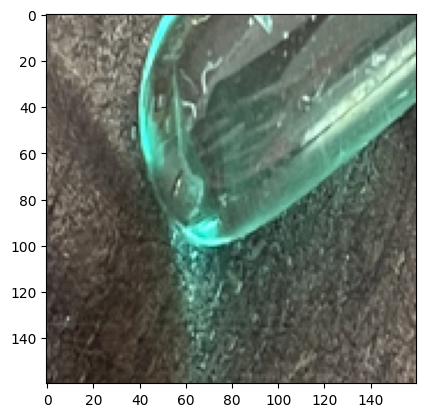

The image you uploaded is: IMG_6264.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 87.72%



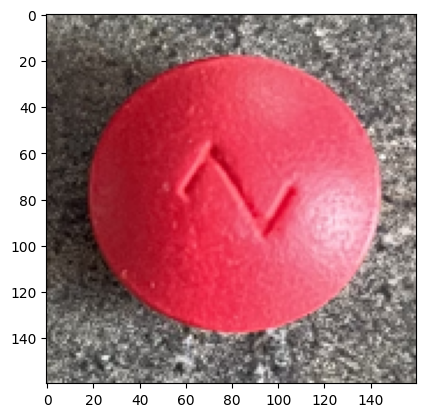

The image you uploaded is: IMG_6271.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 97.62%



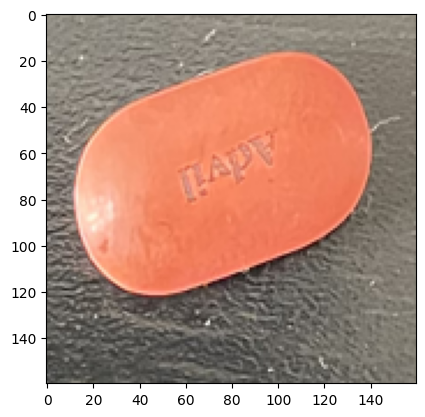

The image you uploaded is: IMG_6288.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 53.46%



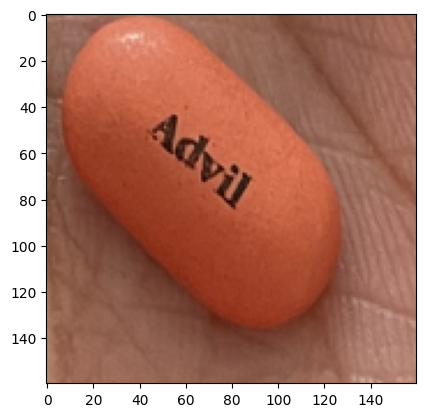

The image you uploaded is: IMG_6267.HEIC
✅ The pill that you uploaded is: 20 advil, with probability 83.3%



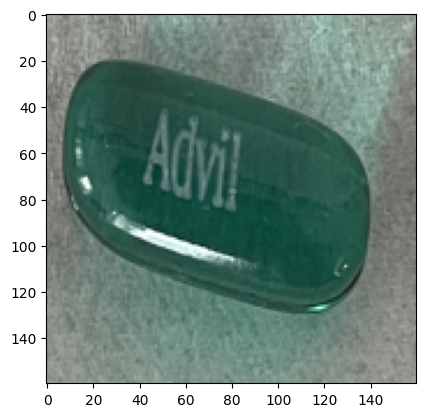

The image you uploaded is: IMG_6292.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 97.06%



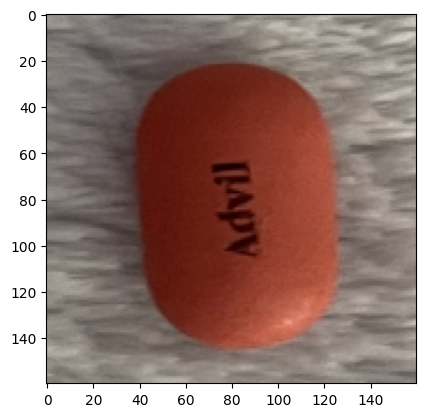

The image you uploaded is: IMG_6284.HEIC
✅ The pill that you uploaded is: 20 advil, with probability 80.74%



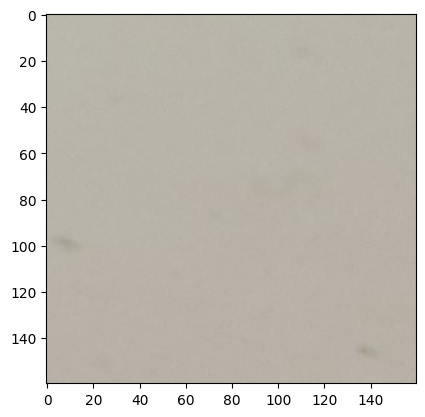

The image you uploaded is: IMG_6302.HEIC
✅ The pill that you uploaded is: 5 50111039801, with probability 20.02%



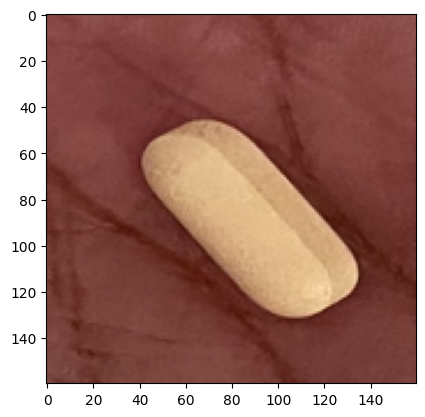

The image you uploaded is: IMG_6314.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 98.19%



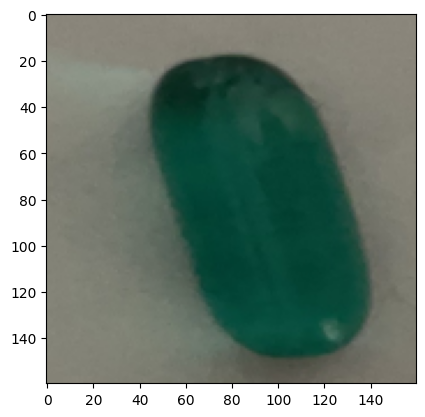

The image you uploaded is: IMG_6303.HEIC
✅ The pill that you uploaded is: 22 advil_liqui-gel, with probability 99.23%



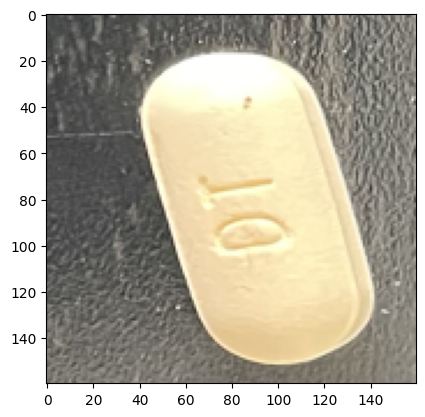

The image you uploaded is: IMG_6285.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 98.08%



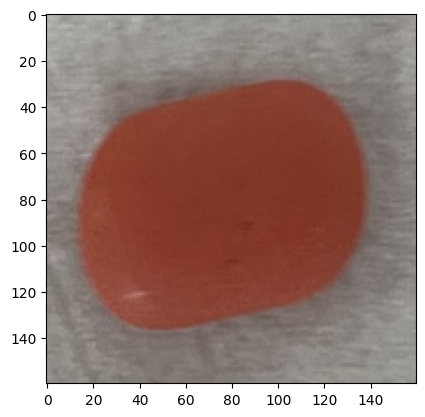

The image you uploaded is: IMG_6293.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 68.13%



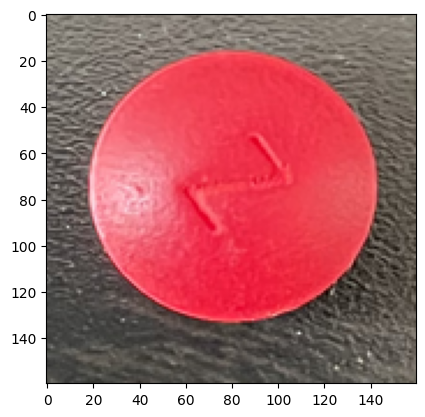

The image you uploaded is: IMG_6289.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 54.4%



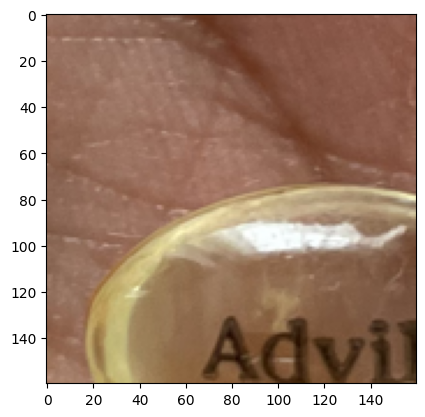

The image you uploaded is: IMG_6266.HEIC
✅ The pill that you uploaded is: 0 172496058, with probability 27.69%



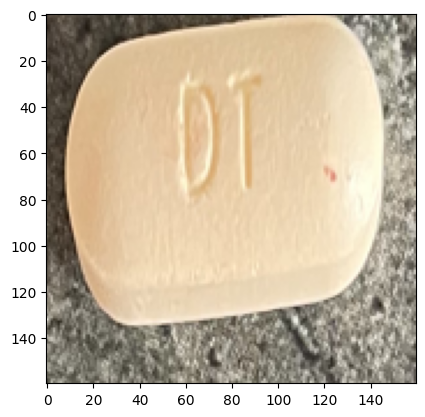

The image you uploaded is: IMG_6270.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 48.27%



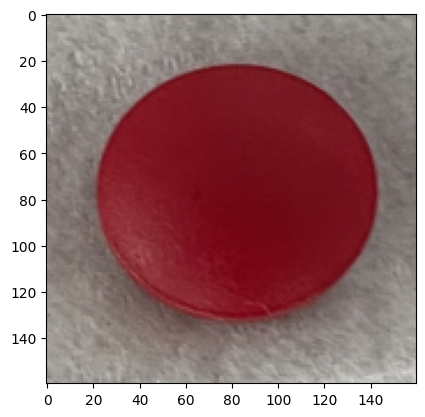

The image you uploaded is: IMG_6294.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 50.12%



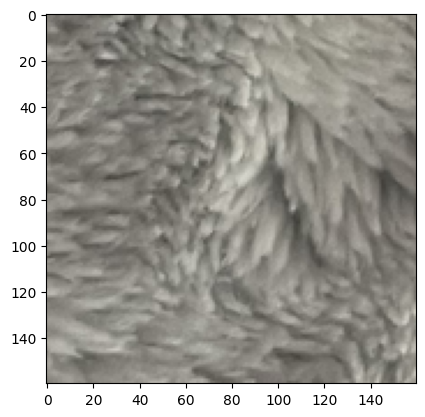

The image you uploaded is: IMG_6282.HEIC
✅ The pill that you uploaded is: 20 advil, with probability 48.15%



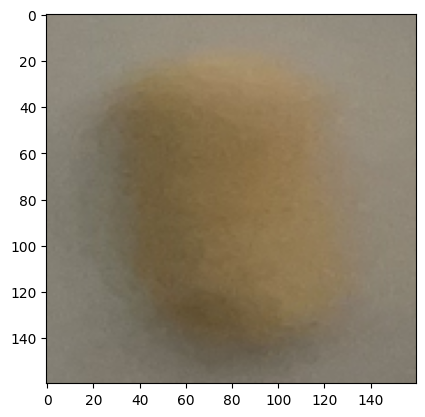

The image you uploaded is: IMG_6304.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 42.86%



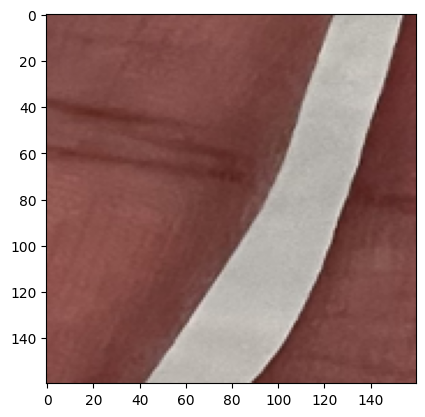

The image you uploaded is: IMG_6312.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 52.56%



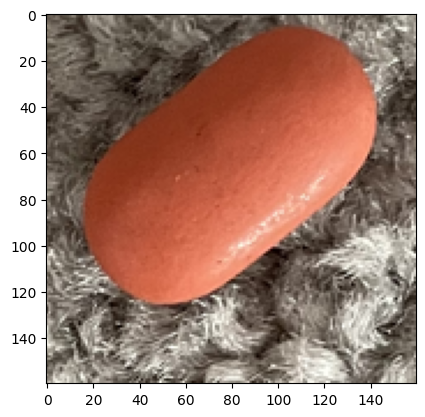

The image you uploaded is: IMG_6298.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 71.28%



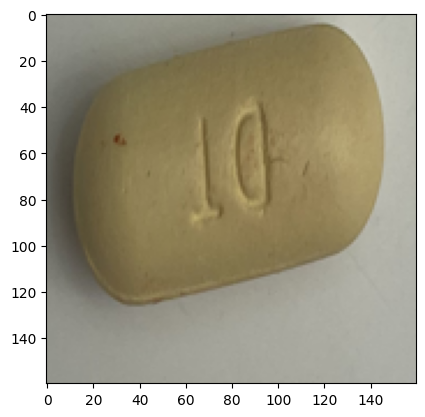

The image you uploaded is: IMG_6277.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 66.43%



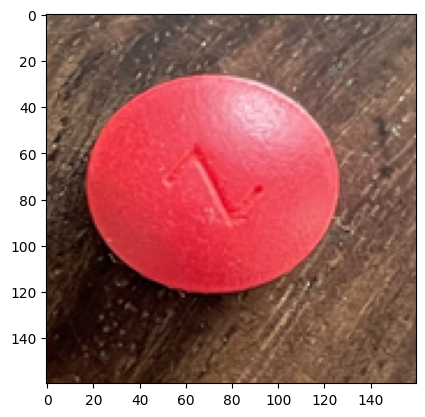

The image you uploaded is: IMG_6261.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 66.86%



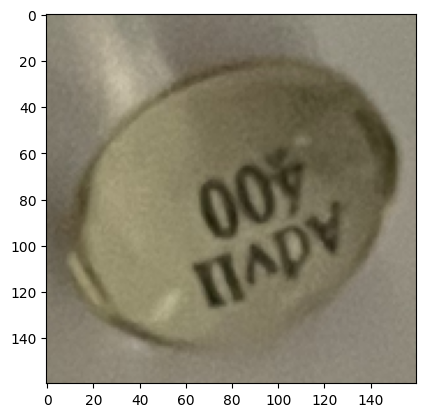

The image you uploaded is: IMG_6308.HEIC
✅ The pill that you uploaded is: 21 advil_400, with probability 84.97%



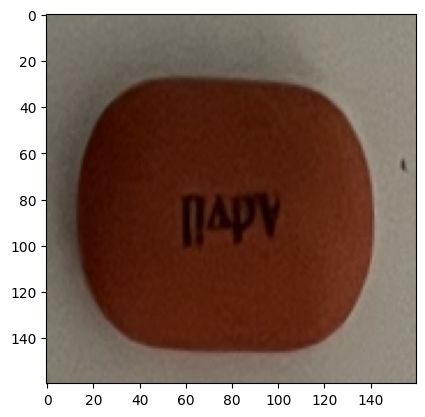

The image you uploaded is: IMG_6309.HEIC
✅ The pill that you uploaded is: 20 advil, with probability 87.8%



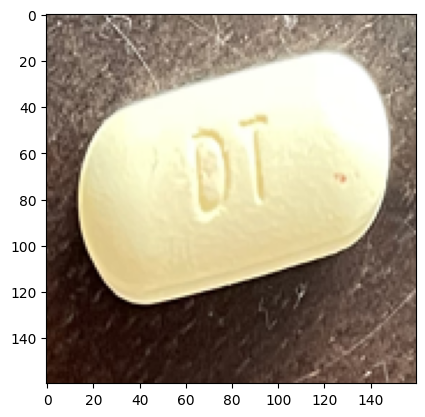

The image you uploaded is: IMG_6260.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 58.82%



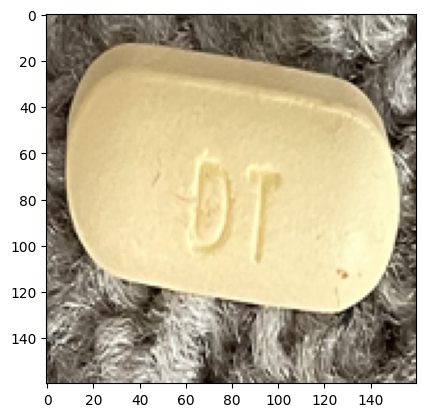

The image you uploaded is: IMG_6299.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 92.89%



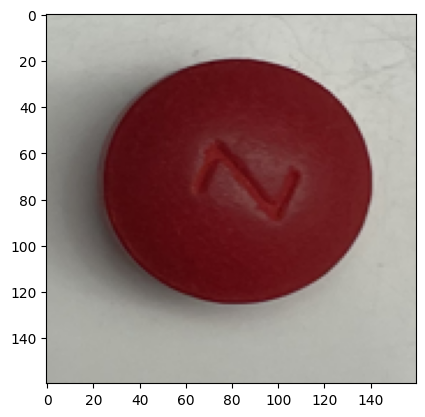

The image you uploaded is: IMG_6276.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 69.97%



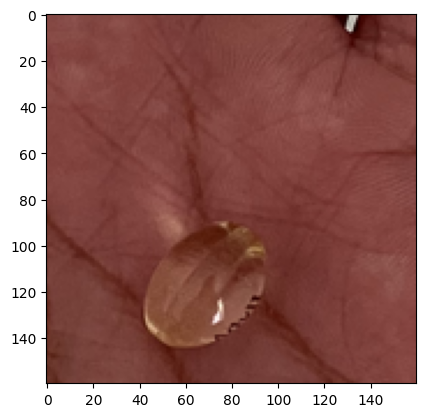

The image you uploaded is: IMG_6313.HEIC
✅ The pill that you uploaded is: 23 kirkland_acetaminophen, with probability 84.29%



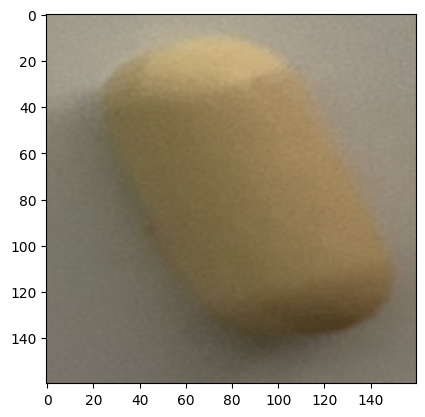

The image you uploaded is: IMG_6305.HEIC
✅ The pill that you uploaded is: 4 49702020218, with probability 30.95%



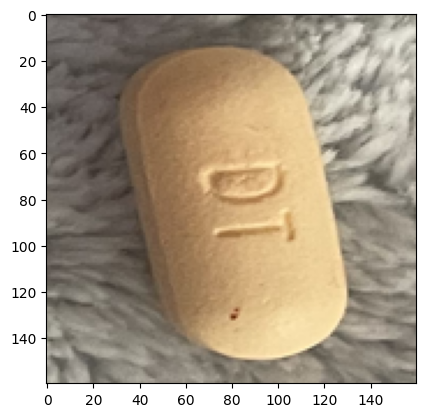

The image you uploaded is: IMG_6283.HEIC
✅ The pill that you uploaded is: 24 life_acetaminophen, with probability 75.31%



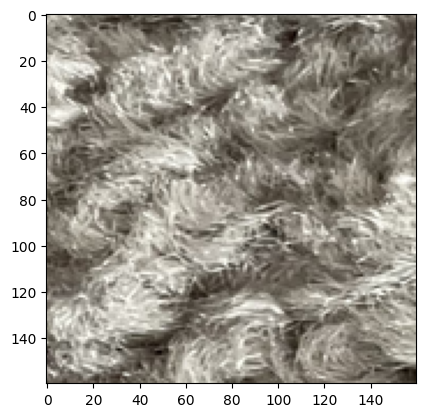

The image you uploaded is: IMG_6295.HEIC
✅ The pill that you uploaded is: 5 50111039801, with probability 32.09%

55


In [46]:
counter = 0
for file_name in os.listdir(images_test_dir):
    
    image_path = os.path.join(images_test_dir, file_name)    
    
    if file_name == '.DS_Store':
        continue
    
    if file_name.endswith('.HEIC'):
        register_heif_opener()
        image =np.array(Image.open(image_path))
        
    else:
        image = np.array(Image.open(image_path))

    result = rf_model.predict(image_path, confidence=40, overlap=30).json()

    # Extracting best pill per image:
    if len(result['predictions']) > 0:
        x = int(result['predictions'][0]['x'])
        y = int(result['predictions'][0]['y'])
        x_size = int(result['predictions'][0]['width'])
        y_size = int(result['predictions'][0]['height'])
        
    image_cropped = image[y-y_size//2:y+y_size//2,x-x_size//2:x+x_size//2,:]
    image_cropped=Image.fromarray(image_cropped)

    rgb_image = image_cropped.convert('RGB') # converts image to RGB
    resized_image = rgb_image.resize((160, 160)) #resized the image to (160, 160)

    resized_image = np.array(resized_image)
    normalized_image = resized_image / 255.0 
    normalized_image -= 0.5 #inception v3 specific
    normalized_image *= 2.0 #inception v3 specific
    
    processed_image = np.expand_dims(normalized_image, axis=0) # converts the image size to (1, 160, 160, 3)

    y_pred = model.predict(processed_image, verbose=[0]) #array of probabilities of the pill being each of the classes
    best_prediction_index = np.argmax(y_pred) #index of the best prediction
    best_prediction_prob = y_pred[0, best_prediction_index] #probability of the pill being best prediction
    pill_name = pillname_dict[best_prediction_index]
    
    plt.imshow(resized_image)
    plt.show()
    print(f"The image you uploaded is: {file_name}")
    print(f"✅ The pill that you uploaded is: {best_prediction_index} {pill_name}, with probability {round(best_prediction_prob * 100, 2)}%\n")
    counter += 1
  
print(counter)
